<center><h1>1-e: Transformers</h1></center>
<center><h2><a href="https://rdfia.github.io/">Course link</a></h2></center>


# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.

In this notebook, we will implement the first Visual Transformer, [ViT](https://arxiv.org/abs/2010.11929). We'll implement a naive version of it, much smaller than the ones described in the paper, and we also won't use complex data augmentation and regularizations. But note that this is important to make transformers work in practice on large-scale dataset.

To get a gist of what is required to make a transformer work in practice, have a look at the [DeiT and CaiT codebase](https://github.com/facebookresearch/deit).

This notebook is a simplified version of the excellent [Timm library](https://github.com/rwightman/pytorch-image-models).

In [1]:
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import pickle
import math

import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms, datasets
import torchvision.utils as vutils
from torch.utils.tensorboard import SummaryWriter
import torchvision
from PIL import Image
import itertools

Let's load the MNIST dataset:

In [3]:
transform = transforms.Compose([
  transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)


train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

100%|██████████| 9912422/9912422 [00:00<00:00, 12435739.43it/s]


Extracting .\MNIST\raw\train-images-idx3-ubyte.gz to .\MNIST\raw



100%|██████████| 28881/28881 [00:00<00:00, 1760539.69it/s]


Extracting .\MNIST\raw\train-labels-idx1-ubyte.gz to .\MNIST\raw



100%|██████████| 1648877/1648877 [00:00<00:00, 9674767.43it/s]


Extracting .\MNIST\raw\t10k-images-idx3-ubyte.gz to .\MNIST\raw



100%|██████████| 4542/4542 [00:00<?, ?it/s]


Extracting .\MNIST\raw\t10k-labels-idx1-ubyte.gz to .\MNIST\raw



... and visualize!

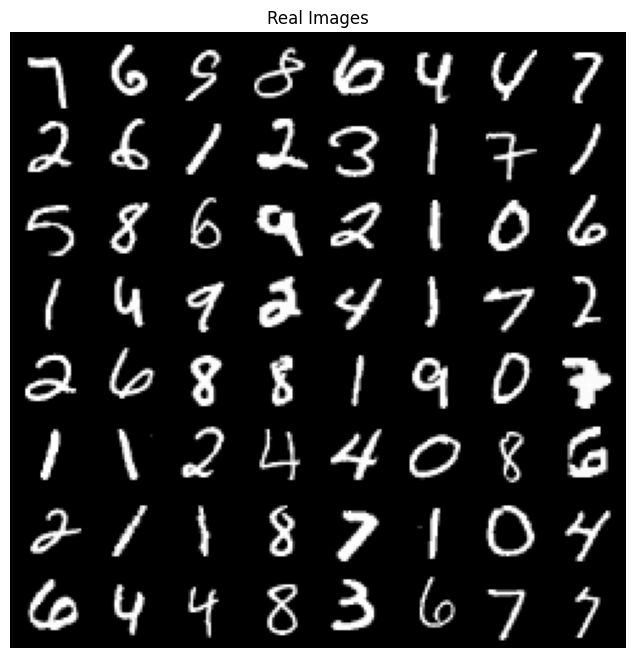

In [4]:
real_batch = next(iter(train_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Real Images")
plt.imshow(vutils.make_grid(real_batch[0][:64], normalize=True).permute(1,2,0))
plt.show()

# Here is the general architecture of the ViT model
## The architecture includes:
- A step for splitting the image into disjoint patches with a linear projection of the patches
- Positional encoding to capture the absolute spatial information of each patch in the image
- The addition of a "[CLS]" token, initialized randomly and learned during training
- A transformer encoder that learns the representation of each token
- A classification head that performs class prediction from the re-embedded [CLS] token at the output of the encoder

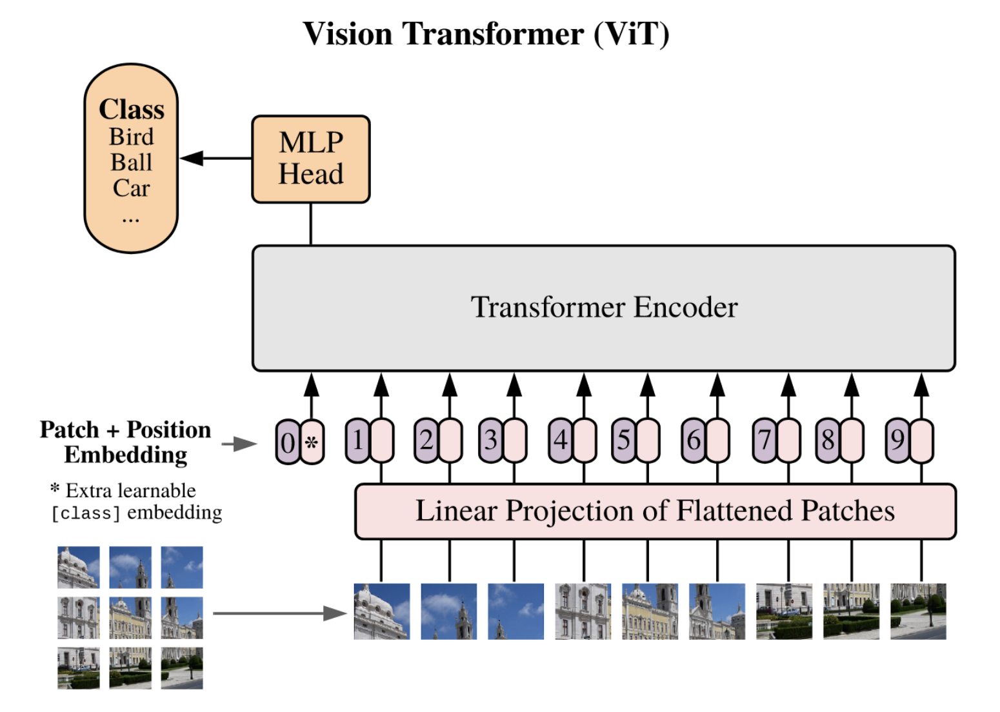



```
# This is formatted as code
```

# Linear Projection of flattened patches

**Q1**:
First, we need to code the patch embedding. In NLP, it could be using a word2vec embeddings, but we need something different in Computer Vision.

You are going to use a specific 2d convolution to play the role of the so-called "Linear Projection" on the image above and process each patch independently without overlap. Think a bit how you could do that.

Then, you need to manipulate the dimensions of the resulting tensor to get a final tensor of shape `(batch_size, nb_tokens, embedding_dim)`. *Hint: You will need a `view/reshape` and `transpose/permute` operators*.

As usual, remember to check the output shape of your layer by trying with a random tensor!

In [5]:
class PatchEmbed(nn.Module):
  def __init__(self, in_chan=1, patch_size=7, embed_dim=128):
    super().__init__()
    self.projection = nn.Conv2d(in_chan, embed_dim, kernel_size=patch_size, stride=patch_size)

  def forward(self, x):
    x = self.projection(x) # x.shape: (B, embed_dim, H', W')
    B, C, H, W = x.shape
    x = x.permute(0,2,3,1) # x.shape: (B,H',W',embed_dim)
    x = x.flatten(1,2) # x.shape: (B,H'*W', embed_dim)
    return x


# To check the output shape
random_tensor = torch.rand((64, 1, 224, 224))  # Example input tensor with batch_size=64, in_chan=1
patch_embed_layer = PatchEmbed()
output_tensor = patch_embed_layer(random_tensor)
print(output_tensor.shape)  # Should print torch.Size([64, 1024, 128]) for patch_size=7


torch.Size([64, 1024, 128])


# Transformer encoder

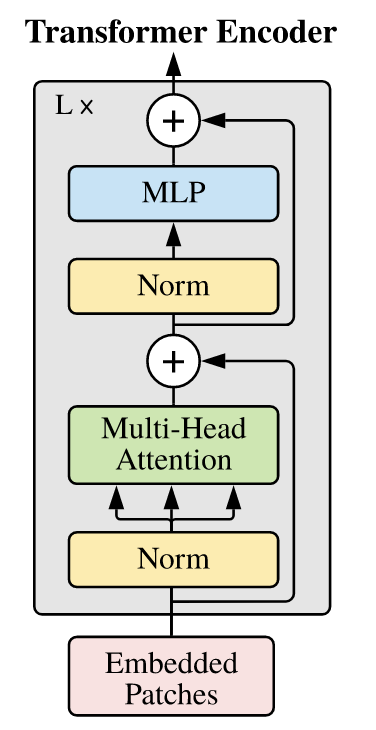

## Q2: MLP

Now we need to build a transformer block. Let's first build the easiest part, the MLP! By now, you should be confident how to code one.

Code a MLP with one hidden layer. Note that the input and output dimensions will be the same. Instead of ReLU, use the activation GELU, which is a slight alternative often used for transformers.

In [6]:
class MLP(nn.Module):
  def __init__(self, in_features, hid_features):
      super(MLP, self).__init__()
      self.hidden = nn.Linear(in_features, hid_features)
      self.output = nn.Linear(hid_features, in_features)

  def forward(self, x):
      x = F.gelu(self.hidden(x))  # Using GELU activation function
      return self.output(x)

mlp = MLP(128,512)
random_tensor = torch.randn(32,16,128)
output = mlp(random_tensor)
output.shape


torch.Size([32, 16, 128])

## Q3: Self-attention

Now we are going to build the famous **Self-Attention**.
- What is the main feature of self-attention, especially compared to its convolutional counterpart. What is its main challenge in terms of computation/memory?
- At first, we are going to only consider the simple case of one head. Write the equations and complete the following code. And don't forget a final linear projection at the end!






*   Self-attention is a mechanism that allows each element in the input to focus on different parts of the input, thereby capturing dependencies regardless of their positions in the input sequence. Unlike convolutional layers which have a local receptive field and are translation-invariant, self-attention can capture long-range dependencies by computing interactions between all pairs of positions in the input sequence.

*   The primary challenge with self-attention in terms of computation and memory arises from the computation of the attention matrix, which is of size $N × N$ (where $N$ is the sequence length). This leads to a time and space complexity of $O(N^2)$, which can be prohibitive for long sequences.

* Here is the simplified self-attention mechanism (for a single head) broken down into steps and integrated into the provided code template 🇰
  1.   Computer Query (Q), Key (K), and Value (V) representations:
    * $Q = X W_Q$
    * $K = X W_K$
    * $V = X W_V$
  2. Compute attention scores:
    * $scores = \frac{QK^T}{\sqrt{d_k}}$
  3. Apply Softmax:
    * $attention = softmax(scores)$
  4. Compute output:
    * $output = attention . V$
  5. Final linear projection:
    * $final\ output = output \cdot W_O$






In [7]:
class SelfAttention(nn.Module):
  def __init__(self, embed_dim):
    super().__init__()
    self.query = nn.Linear(embed_dim,embed_dim)
    self.key = nn.Linear(embed_dim,embed_dim)
    self.value = nn.Linear(embed_dim,embed_dim)
    self.final_linear = nn.Linear(embed_dim,embed_dim)



  def forward(self, x):
    # B: Batch, N: Nb patches, C: Embedding Dim
    B, N, C = x.shape

    q = self.query(x) # Shape: (B, N, C)
    k = self.key(x) # Shape: (B, N, C)
    v = self.value(x) # Shape: (B, N, C)

    scores = torch.matmul(q,k.transpose(-2,-1)) // (C ** 0.5) # Shape: (B, N, N)
    attention = F.softmax(scores,dim=-1) # Shape: (B, N, C) / dim = -1 meaning softmax must me applied on last dimension of scores
    output = torch.matmul(attention,v) # Shape: (B, N, C)
    final_output = self.final_linear(output) # Shape: (B, N, C)
    return final_output

# Testing the shape of the output
self_attention_layer = SelfAttention(128)
output = self_attention_layer(torch.randn(32,16,128))
print(output.shape) # Expected Output: torch.Size([32, 16, 128])

torch.Size([32, 16, 128])


# Q4 : Multi-head self-attention

Now we need to build a Multi-Heads Self-Attention.
- Write the equations and complete the following code to build a Multi-Heads Self-Attention.
- The total embedding size will be shared equally among all heads.

In [8]:
class MultiHeadsSelfAttention(nn.Module):
  def __init__(self, embed_dim, num_heads):
    super().__init__()

    assert embed_dim % num_heads == 0 # Ensure the embedding dimension is divisible by the number of heads

    head_dim = embed_dim // num_heads
    self.scale = head_dim ** -0.5
    self.num_heads = num_heads

    self.q = nn.Linear(embed_dim,embed_dim)
    self.k = nn.Linear(embed_dim,embed_dim)
    self.v = nn.Linear(embed_dim,embed_dim)
    self.projection = nn.Linear(embed_dim,embed_dim)

  def forward(self, x):
    B, N, C = x.shape
    # Compute Q, K, V representations
    q = self.q(x)
    k = self.k(x)
    v = self.v(x)


    # Reshape Q, K, V for multi-head computation
    q = q.view(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3) # Shape: (B, num_heads, N, head_dim)
    k = k.view(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3) # Shape: (B, num_heads, N, head_dim)
    v = v.view(B, N, self.num_heads, C // self.num_heads).permute(0, 2, 1, 3) # Shape: (B, num_heads, N, head_dim)

    # Compute the attention scores
    scores    = torch.matmul(q, k.transpose(-2,-1)) * self.scale  # Shape: (B, num_heads, N, N)
    attention = F.softmax(scores, dim=-1)  # Shape: (B, num_heads, N, N)

    # Compute the output of the attention
    output = torch.matmul(attention,v) # Shape: (B, num_heads, N, head_dim)

    # Concatenate heads and apply final projection
    output = output.permute(0,2,1,3).contiguous().view(B,N,C)
    output = self.projection(output)

    """
    output.permute(0, 2, 1, 3) is reordering the dimensions of the tensor output. If the current shape of output is (B, num_heads, N, head_dim), the permute operation swaps the 2nd and 3rd dimensions, resulting in a shape of (B, N, num_heads, head_dim).

    contiguous() is a PyTorch operation that makes a copy of the tensor such that the order of its elements in memory is the same as if it had been created from scratch with the same data.
    It's often used before view() because view() requires the tensor to be contiguous in memory, and some operations like permute result in non-contiguous tensors.

    view(B, N, C) is reshaping the tensor back to its original shape of (B, N, C). Here, C is the total embedding dimension, which is num_heads * head_dim.
    This is done by merging the num_heads and head_dim dimensions into a single dimension.

    Here's a step-by-step breakdown of the transformations:
      Initial Shape: (B, num_heads, N, head_dim)
      After permute: (B, N, num_heads, head_dim)
      After contiguous: Still (B, N, num_heads, head_dim) but now the tensor is contiguous in memory.
      After view: (B, N, C) where C = num_heads * head_dim
    """
    return output


MultiHeadsSelfAttention(128, 2)(random_tensor).shape

torch.Size([32, 16, 128])

# Q5: Transfomer block

Now, we need to build a Transformer **Block** as described in the image below.
- Write the equations and complete the following code.
- For the Layer Normalization, use PyTorch LayerNorm: https://pytorch.org/docs/stable/generated/torch.nn.LayerNorm.html

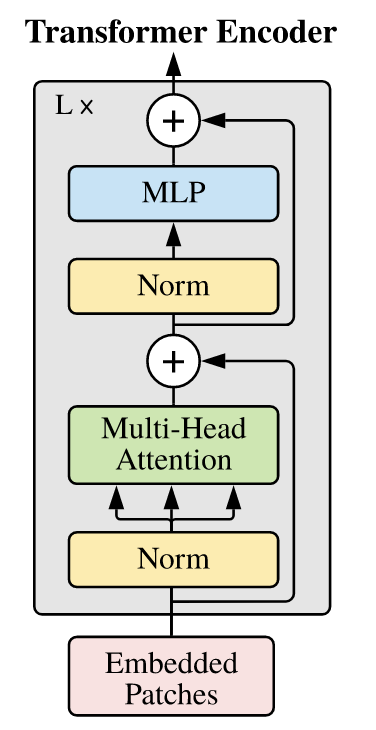

In [9]:
class Block(nn.Module):
  def __init__(self, embed_dim, num_heads=4, mlp_ratio=4):
    super(Block, self).__init__()
    self.norm1 = nn.LayerNorm(embed_dim)
    self.mhsa  = MultiHeadsSelfAttention(embed_dim, num_heads)
    self.norm2 = nn.LayerNorm(embed_dim)
    self.mlp = MLP(embed_dim, embed_dim * mlp_ratio)

  def forward(self, x):
    # Applying the first Layer Normalization and Multi-Head Self Attention
    attention_output = self.mhsa(self.norm1(x))
    x = x + attention_output # Residual connection

    # Applying the second Layer Normalization and MLP
    mlp_output = self.mlp(self.norm2(x))
    x = x + mlp_output # Residual Connection

    return x


"""
Residual Connections (Skip Connections):

The lines x = x + attn_output and x = x + mlp_output are instances of residual connections or skip connections.
A residual connection is a shortcut that bypasses one or more layers. In this case, the original input x is added to the output of the multi-head self-attention (MHSA) layer and the multi-layer perceptron (MLP) layer. This helps to propagate information directly through the network, which can aid in training deeper models by alleviating the vanishing gradient problem.
attn_output and mlp_output:

attn_output: This is the output of the Multi-Head Self-Attention layer. It represents the learned relationships between different parts of the input x.
mlp_output: This is the output of the Multi-Layer Perceptron layer. It represents a further non-linear transformation of the input x.
By adding these outputs back to the original input x, the model is allowed to retain the original information while also incorporating the learned transformations and relationships.
MLP Ratio:

The mlp_ratio is a hyperparameter that determines the expansion factor of the hidden layer in the MLP relative to the input dimension.
For example, if mlp_ratio = 4 and embed_dim = 128, then the hidden layer of the MLP will have 128 * 4 = 512 units. This expansion allows the MLP to learn more complex transformations.
"""


Block(128)(torch.randn(32, 16, 128)).shape

torch.Size([32, 16, 128])

# Q6: Full ViT model

Now you need to build a ViT model based on what you coded in the previous questions. There are additional components that should be coded such as the Class token, Positional embedding and the classification head.

- Explain what is a Class token and why we use it? \\
- Explain whay is the the positional embedding (PE) and why it is important? \\

For PE, you can use a sinusoidal encoding (see below), or fully learned.



*   **Class Token:** In the Vision Transformer (ViT), a special token known as the Class Token is prepended to the sequence of flattened image patches. This token is used as a learnable representation for the entire image, and its final representation at the end of the transformer encoder is used for classification.
The Class Token allows the model to have a global representation which aggregates information across the entire image, facilitating the final classification task.


*   **Positional Embedding (PE):** The transformer architecture is permutation-invariant, meaning it doesn't have an inherent understanding of the order of tokens in a sequence. However, in image processing, the relative positions of patches are crucial for understanding the spatial structure of the image.
Positional embeddings are added to the patch embeddings to provide the model with information about the spatial location of each patch. They are usually implemented as a fixed or learnable addition to the patch embeddings.
By incorporating positional information, the model can learn spatial hierarchies and relationships among patches, which is important for capturing the 2D structure of the image.








### Sinusoidal PE


In [10]:
def get_positional_embeddings(sequence_length, d):
    result = torch.ones(1,sequence_length, d)
    for i in range(sequence_length):
        for j in range(d):
            result[0][i][j] = np.sin(i / (10000 ** (j / d))) if j % 2 == 0 else np.cos(i / (10000 ** ((j - 1) / d)))
    return result

In [11]:
class ViT(nn.Module):
  def __init__(self, embed_dim, nb_blocks, patch_size, nb_classes=10):
    super().__init__()

    num_patches = (28 // patch_size) ** 2

    self.class_token = nn.Parameter(torch.randn(1,1,embed_dim))
    self.pos_embed = nn.Parameter(torch.randn(1,num_patches + 1, embed_dim))
    self.patch_embed = PatchEmbed(patch_size=patch_size, embed_dim=embed_dim)

    blocks = []
    for _ in range(nb_blocks):
      blocks.append(
          Block(embed_dim)
      )
    self.blocks = nn.Sequential(*blocks)

    self.norm = nn.LayerNorm(embed_dim)
    self.head = nn.Linear(embed_dim,nb_classes) # Classification head

  def forward(self, x):
    x = self.patch_embed(x)                         ## image to patches
    B,_,_ = x.shape                                 ## get batch size
    cls_token = self.class_token.expand(B, -1, -1)  ## Expand class token to batch size
    x = torch.cat((cls_token,x), dim = 1)           ## Concatenating class token
    x = x + self.pos_embed                          ## adding positional embedding

    x = self.blocks(x)                              ## forward in the transformer
    x = self.norm(x)                                ## Normalize the output

    output = self.head(x[:, 0])                     ## Classification output using the representation of the class token
    return output


ViT(128, 3, 7)(torch.randn(32, 1, 28, 28)).shape

torch.Size([32, 10])

# Q7: Experiment on MNIST!

A quick function to evaluate our model:

In [12]:
@torch.no_grad()
def eval_model(model, loader):
  model.eval()
  acc = 0.
  c = 0

  for x, y in loader:
    x, y = x.cuda(), y.cuda()
    yhat = model(x)

    acc += torch.sum(yhat.argmax(dim=1) == y).cpu().item()
    c += len(x)

  model.train()
  return round(100 * acc / c, 2)

And run! Feel free to try other hyperparameters.

In [22]:
epochs = 20

embed_dim = 128
patch_size = 14
nb_blocks = 6

model = ViT(embed_dim, nb_blocks, patch_size).cuda()

opt = torch.optim.Adam(model.parameters())

for epoch in range(epochs):
  train_loss = 0.
  for x, y in train_loader:
    x, y = x.cuda(), y.cuda()

    opt.zero_grad()
    yhat = model(x)
    loss = F.cross_entropy(yhat, y)
    loss.backward()

    opt.step()

    train_loss += loss.item()

  print(f"--- Epoch {epoch} ---")
  print(f"Train loss: {train_loss / len(train_loader)}")
acc = eval_model(model, test_loader)
print(f"Test accuracy: {acc}")


--- Epoch 0 ---
Train loss: 0.46166099461792376
--- Epoch 1 ---
Train loss: 0.13701412595236606
--- Epoch 2 ---
Train loss: 0.10254769899181403
--- Epoch 3 ---
Train loss: 0.08479247252141107
--- Epoch 4 ---
Train loss: 0.07383557533952537
--- Epoch 5 ---
Train loss: 0.0664223363138497
--- Epoch 6 ---
Train loss: 0.058923573901396256
--- Epoch 7 ---
Train loss: 0.05583918546296672
--- Epoch 8 ---
Train loss: 0.05046354530097198
--- Epoch 9 ---
Train loss: 0.04727612016772204
--- Epoch 10 ---
Train loss: 0.04560833266958086
--- Epoch 11 ---
Train loss: 0.039759862921766635
--- Epoch 12 ---
Train loss: 0.0353438623640726
--- Epoch 13 ---
Train loss: 0.0407754399171814
--- Epoch 14 ---
Train loss: 0.03564385786977237
--- Epoch 15 ---
Train loss: 0.029821883583727327
--- Epoch 16 ---
Train loss: 0.03429651306768351
--- Epoch 17 ---
Train loss: 0.027262182294655202
--- Epoch 18 ---
Train loss: 0.027762595147861523
--- Epoch 19 ---
Train loss: 0.02758637690635672
Test accuracy: 97.78


In [16]:
from tqdm import tqdm
import time
import numpy as np
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns


transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

embed_dims = [32, 64, 128, 256, 512]
performance_metrics = {
    'embed_dim': [],
    'train_losses': [],
    'test_losses': [],
    'train_accuracies': [],
    'test_accuracies': [],
    'time_taken': []
}

for embed_dim in tqdm(embed_dims, desc='EmbedDim Variation'):
    model = ViT(embed_dim,2,7).to(device)
    optimizer = torch.optim.Adam(model.parameters())

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    start_time = time.time()

    for epoch in range(20):  # Assuming 20 epochs
        model.train()
        total_train_loss = 0
        correct_train = 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            outputs = model(x)
            loss = F.cross_entropy(outputs, y)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
            correct_train += (outputs.argmax(1) == y).type(torch.float).sum().item()
        avg_train_loss = total_train_loss / len(train_loader)
        train_accuracy = correct_train / len(train_dataset)
        train_losses.append(avg_train_loss)
        train_accuracies.append(train_accuracy)

        model.eval()
        total_test_loss = 0
        correct_test = 0
        with torch.no_grad():
            for x_test, y_test in test_loader:
                x_test, y_test = x_test.to(device), y_test.to(device)
                outputs_test = model(x_test)
                test_loss = F.cross_entropy(outputs_test, y_test)
                total_test_loss += test_loss.item()
                correct_test += (outputs_test.argmax(1) == y_test).type(torch.float).sum().item()
        avg_test_loss = total_test_loss / len(test_loader)
        test_accuracy = correct_test / len(test_dataset)
        test_losses.append(avg_test_loss)
        test_accuracies.append(test_accuracy)

    end_time = time.time()
    time_taken = end_time - start_time

    performance_metrics['embed_dim'].append(embed_dim)
    performance_metrics['train_losses'].append(train_losses)
    performance_metrics['test_losses'].append(test_losses)
    performance_metrics['train_accuracies'].append(train_accuracies)
    performance_metrics['test_accuracies'].append(test_accuracies)
    performance_metrics['time_taken'].append(time_taken)




EmbedDim Variation:   0%|          | 0/5 [00:00<?, ?it/s]

EmbedDim Variation: 100%|██████████| 5/5 [12:06<00:00, 145.21s/it]


C:\Users\maebo\AppData\Local\Temp\ipykernel_32484\3920084398.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='embed_dim', y='time_taken', data=pd.DataFrame(performance_metrics), palette='Blues_d')


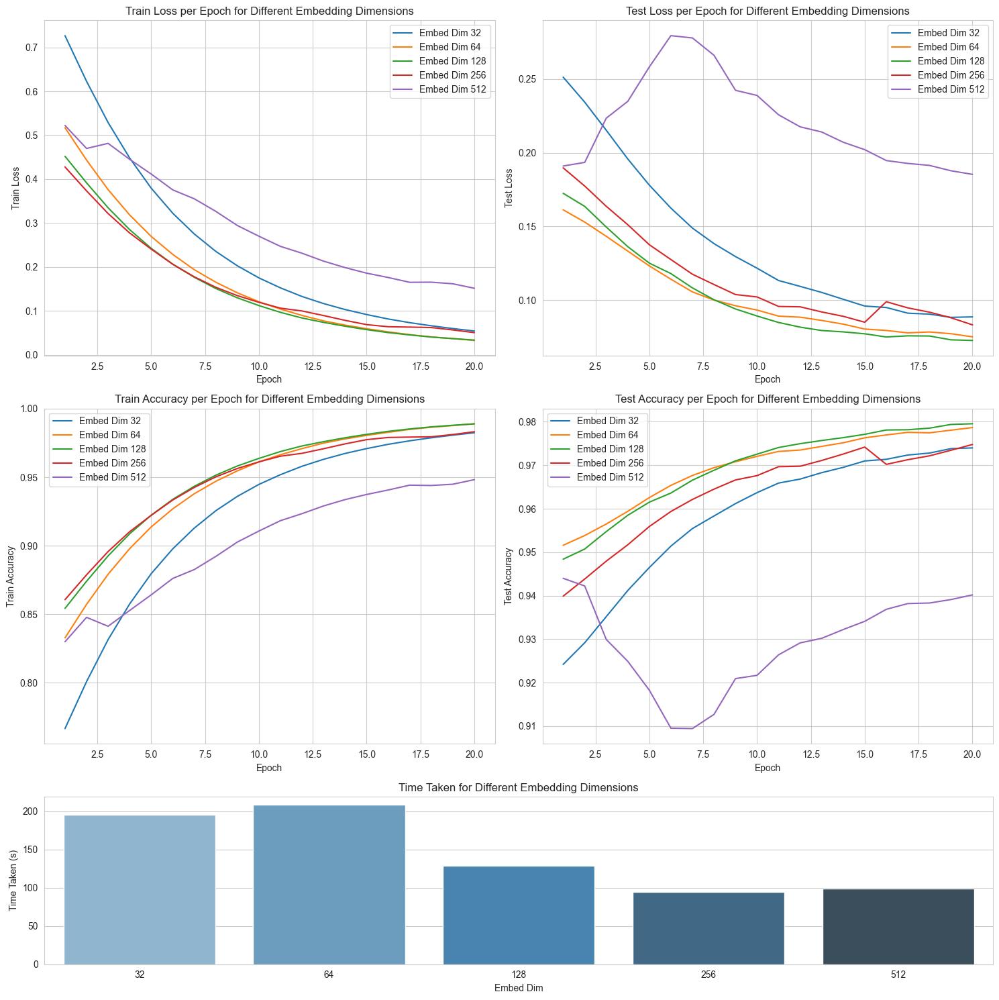

In [18]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import pandas as pd

sns.set_style("whitegrid")  # This will add gridlines and a white background


# Create the figure with GridSpec layout
fig = plt.figure(figsize=(15, 15))
grid = GridSpec(3, 2, height_ratios=[1, 1, 0.5])

# Helper function to smooth data
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Train Loss
ax1 = fig.add_subplot(grid[0, 0])
for idx, loss in enumerate(performance_metrics['train_losses']):
    smoothed_loss = smooth_curve(loss)
    sns.lineplot(x=list(range(1, len(smoothed_loss)+1)), y=smoothed_loss, label=f'Embed Dim {performance_metrics["embed_dim"][idx]}')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Train Loss')
ax1.set_title('Train Loss per Epoch for Different Embedding Dimensions')
ax1.legend()

# Test Loss
ax2 = fig.add_subplot(grid[0, 1])
for idx, loss in enumerate(performance_metrics['test_losses']):
    smoothed_loss = smooth_curve(loss)
    sns.lineplot(x=list(range(1, len(smoothed_loss)+1)), y=smoothed_loss, label=f'Embed Dim {performance_metrics["embed_dim"][idx]}')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Test Loss')
ax2.set_title('Test Loss per Epoch for Different Embedding Dimensions')
ax2.legend()

# Train Accuracy
ax3 = fig.add_subplot(grid[1, 0])
for idx, acc in enumerate(performance_metrics['train_accuracies']):
    smoothed_acc = smooth_curve(acc)
    sns.lineplot(x=list(range(1, len(smoothed_acc)+1)), y=smoothed_acc, label=f'Embed Dim {performance_metrics["embed_dim"][idx]}')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Train Accuracy')
ax3.set_title('Train Accuracy per Epoch for Different Embedding Dimensions')
ax3.legend()

# Test Accuracy
ax4 = fig.add_subplot(grid[1, 1])
for idx, acc in enumerate(performance_metrics['test_accuracies']):
    smoothed_acc = smooth_curve(acc)
    sns.lineplot(x=list(range(1, len(smoothed_acc)+1)), y=smoothed_acc, label=f'Embed Dim {performance_metrics["embed_dim"][idx]}')
ax4.set_xlabel('Epoch')
ax4.set_ylabel('Test Accuracy')
ax4.set_title('Test Accuracy per Epoch for Different Embedding Dimensions')
ax4.legend()

# Time Taken
ax5 = fig.add_subplot(grid[2, :])
sns.barplot(x='embed_dim', y='time_taken', data=pd.DataFrame(performance_metrics), palette='Blues_d')
ax5.set_xlabel('Embed Dim')
ax5.set_ylabel('Time Taken (s)')
ax5.set_title('Time Taken for Different Embedding Dimensions')

# Adjust the layout
plt.tight_layout()

# Save the figure
fig.savefig('embed_dim.pdf', format='pdf', bbox_inches='tight')

# Show the plots
plt.show()


In [47]:
from tqdm import tqdm
import time
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
import torch.nn.functional as F


transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

nb_blocks_list = [2, 4, 6, 8, 10, 12]
performance_metrics = {
    'nb_blocks': [],
    'train_losses': [],
    'test_losses': [],
    'train_accuracies': [],
    'test_accuracies': [],
    'time_taken': []
}

for nb_blocks in tqdm(nb_blocks_list, desc='NbBlocks Variation'):
    model = ViT(128, nb_blocks, 7).to(device)  # Fixed first parameter to 128
    optimizer = torch.optim.Adam(model.parameters())

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    start_time = time.time()

    for epoch in range(20):  # Assuming 20 epochs
        model.train()
        total_train_loss = 0
        correct_train = 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            outputs = model(x)
            loss = F.cross_entropy(outputs, y)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
            correct_train += (outputs.argmax(1) == y).type(torch.float).sum().item()
        avg_train_loss = total_train_loss / len(train_loader)
        train_accuracy = correct_train / len(train_dataset)
        train_losses.append(avg_train_loss)
        train_accuracies.append(train_accuracy)

        model.eval()
        total_test_loss = 0
        correct_test = 0
        with torch.no_grad():
            for x_test, y_test in test_loader:
                x_test, y_test = x_test.to(device), y_test.to(device)
                outputs_test = model(x_test)
                test_loss = F.cross_entropy(outputs_test, y_test)
                total_test_loss += test_loss.item()
                correct_test += (outputs_test.argmax(1) == y_test).type(torch.float).sum().item()
        avg_test_loss = total_test_loss / len(test_loader)
        test_accuracy = correct_test / len(test_dataset)
        test_losses.append(avg_test_loss)
        test_accuracies.append(test_accuracy)

    end_time = time.time()
    time_taken = end_time - start_time

    performance_metrics['nb_blocks'].append(nb_blocks)
    performance_metrics['train_losses'].append(train_losses)
    performance_metrics['test_losses'].append(test_losses)
    performance_metrics['train_accuracies'].append(train_accuracies)
    performance_metrics['test_accuracies'].append(test_accuracies)
    performance_metrics['time_taken'].append(time_taken)


NbBlocks Variation: 100%|██████████| 6/6 [16:38<00:00, 166.48s/it]


C:\Users\maebo\AppData\Local\Temp\ipykernel_15520\2918284979.py:65: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




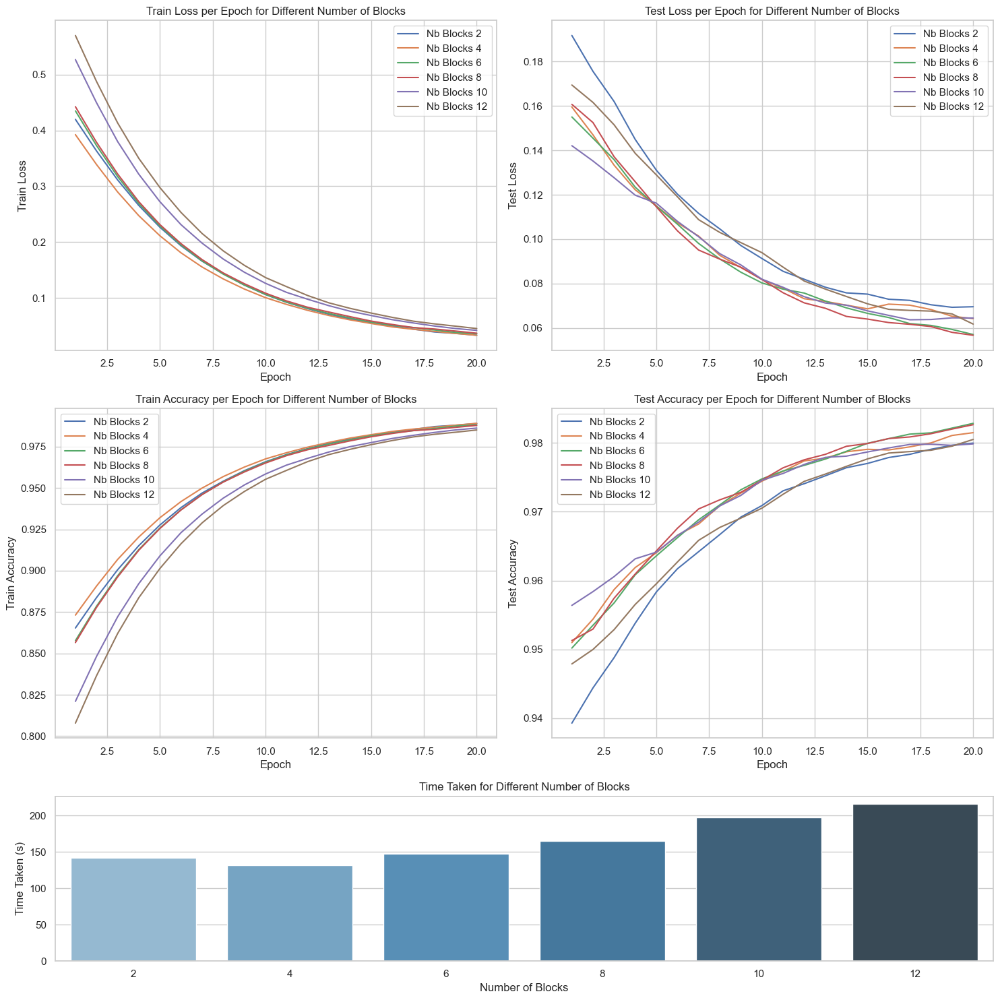

In [54]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import pandas as pd


# Create the figure with GridSpec layout
fig = plt.figure(figsize=(15, 15))
grid = GridSpec(3, 2, height_ratios=[1, 1, 0.5])

# Helper function to smooth data
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Train Loss
ax1 = fig.add_subplot(grid[0, 0])
for idx, loss in enumerate(performance_metrics['train_losses']):
    smoothed_loss = smooth_curve(loss)
    sns.lineplot(x=list(range(1, len(smoothed_loss)+1)), y=smoothed_loss, label=f'Nb Blocks {performance_metrics["nb_blocks"][idx]}')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Train Loss')
ax1.set_title('Train Loss per Epoch for Different Number of Blocks')
ax1.legend()

# Test Loss
ax2 = fig.add_subplot(grid[0, 1])
for idx, loss in enumerate(performance_metrics['test_losses']):
    smoothed_loss = smooth_curve(loss)
    sns.lineplot(x=list(range(1, len(smoothed_loss)+1)), y=smoothed_loss, label=f'Nb Blocks {performance_metrics["nb_blocks"][idx]}')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Test Loss')
ax2.set_title('Test Loss per Epoch for Different Number of Blocks')
ax2.legend()

# Train Accuracy
ax3 = fig.add_subplot(grid[1, 0])
for idx, acc in enumerate(performance_metrics['train_accuracies']):
    smoothed_acc = smooth_curve(acc)
    sns.lineplot(x=list(range(1, len(smoothed_acc)+1)), y=smoothed_acc, label=f'Nb Blocks {performance_metrics["nb_blocks"][idx]}')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Train Accuracy')
ax3.set_title('Train Accuracy per Epoch for Different Number of Blocks')
ax3.legend()

# Test Accuracy
ax4 = fig.add_subplot(grid[1, 1])
for idx, acc in enumerate(performance_metrics['test_accuracies']):
    smoothed_acc = smooth_curve(acc)
    sns.lineplot(x=list(range(1, len(smoothed_acc)+1)), y=smoothed_acc, label=f'Nb Blocks {performance_metrics["nb_blocks"][idx]}')
ax4.set_xlabel('Epoch')
ax4.set_ylabel('Test Accuracy')
ax4.set_title('Test Accuracy per Epoch for Different Number of Blocks')
ax4.legend()

# Time Taken
ax5 = fig.add_subplot(grid[2, :])
sns.barplot(x='nb_blocks', y='time_taken', data=pd.DataFrame(performance_metrics), palette='Blues_d')
ax5.set_xlabel('Number of Blocks')
ax5.set_ylabel('Time Taken (s)')
ax5.set_title('Time Taken for Different Number of Blocks')

# Adjust the layout
plt.tight_layout()

# Save the figure
fig.savefig('nb_blocks_variation.pdf', format='pdf', bbox_inches='tight')

# Show the plots
plt.show()


In [19]:
from tqdm import tqdm
import time
import torch
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms
import torch.nn.functional as F



transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

patch_sizes = [2, 4, 7, 14]
performance_metrics = {
    'patch_size': [],
    'train_losses': [],
    'test_losses': [],
    'train_accuracies': [],
    'test_accuracies': [],
    'time_taken': []
}

for patch_size in tqdm(patch_sizes, desc='PatchSize Variation'):
    model = ViT(128, 2, patch_size).to(device)  # The first parameter is 128, the second is fixed to 2
    optimizer = torch.optim.Adam(model.parameters())

    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    start_time = time.time()

    for epoch in range(20):  # Assuming 20 epochs
        model.train()
        total_train_loss = 0
        correct_train = 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            outputs = model(x)
            loss = F.cross_entropy(outputs, y)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
            correct_train += (outputs.argmax(1) == y).type(torch.float).sum().item()
        avg_train_loss = total_train_loss / len(train_loader)
        train_accuracy = correct_train / len(train_dataset)
        train_losses.append(avg_train_loss)
        train_accuracies.append(train_accuracy)

        model.eval()
        total_test_loss = 0
        correct_test = 0
        with torch.no_grad():
            for x_test, y_test in test_loader:
                x_test, y_test = x_test.to(device), y_test.to(device)
                outputs_test = model(x_test)
                test_loss = F.cross_entropy(outputs_test, y_test)
                total_test_loss += test_loss.item()
                correct_test += (outputs_test.argmax(1) == y_test).type(torch.float).sum().item()
        avg_test_loss = total_test_loss / len(test_loader)
        test_accuracy = correct_test / len(test_dataset)
        test_losses.append(avg_test_loss)
        test_accuracies.append(test_accuracy)

    end_time = time.time()
    time_taken = end_time - start_time

    performance_metrics['patch_size'].append(patch_size)
    performance_metrics['train_losses'].append(train_losses)
    performance_metrics['test_losses'].append(test_losses)
    performance_metrics['train_accuracies'].append(train_accuracies)
    performance_metrics['test_accuracies'].append(test_accuracies)
    performance_metrics['time_taken'].append(time_taken)


PatchSize Variation:   0%|          | 0/4 [00:00<?, ?it/s]

PatchSize Variation: 100%|██████████| 4/4 [08:41<00:00, 130.36s/it]


C:\Users\maebo\AppData\Local\Temp\ipykernel_32484\3677166237.py:66: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='patch_size', y='time_taken', data=pd.DataFrame(performance_metrics), palette='Blues_d')


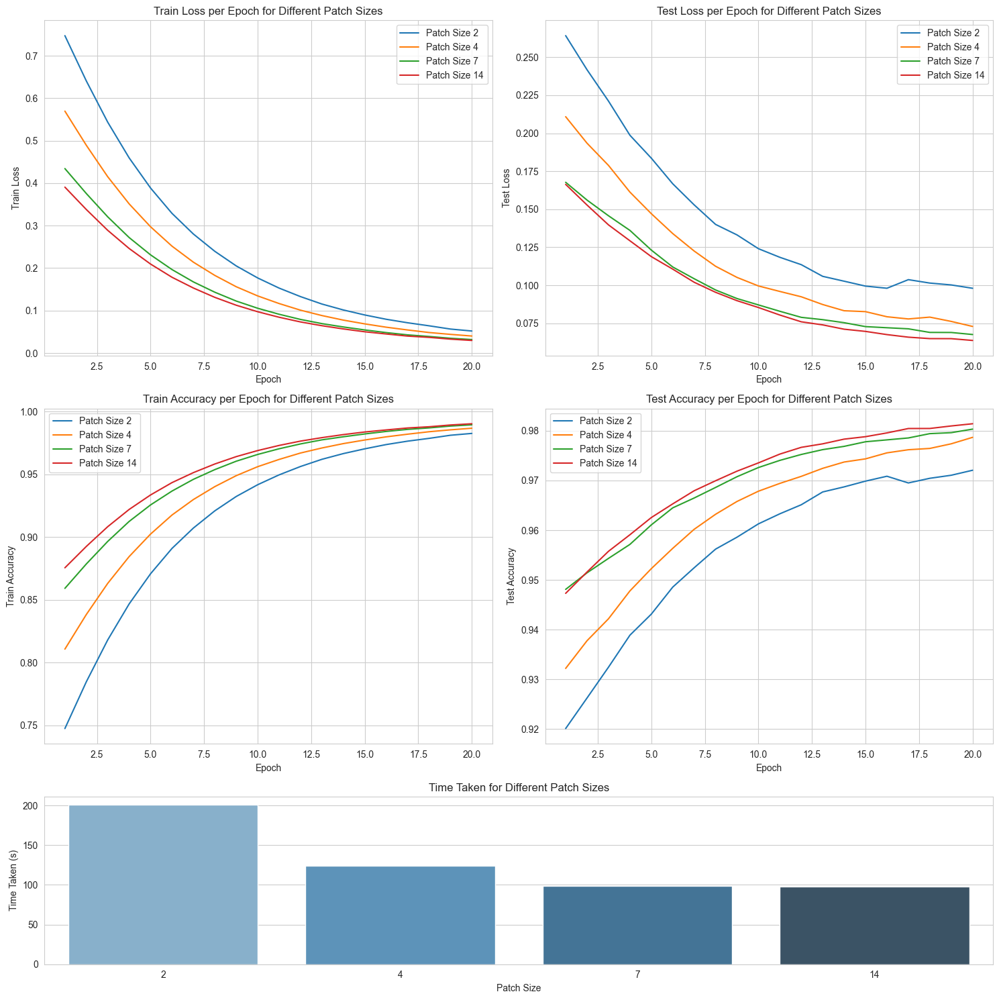

In [21]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import pandas as pd

sns.set_style("whitegrid")  # This will add gridlines and a white background


# Create the figure with GridSpec layout
fig = plt.figure(figsize=(15, 15))
grid = GridSpec(3, 2, height_ratios=[1, 1, 0.5])

# Helper function to smooth data
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Train Loss
ax1 = fig.add_subplot(grid[0, 0])
for idx, loss in enumerate(performance_metrics['train_losses']):
    smoothed_loss = smooth_curve(loss)
    sns.lineplot(x=list(range(1, len(smoothed_loss)+1)), y=smoothed_loss, label=f'Patch Size {performance_metrics["patch_size"][idx]}')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Train Loss')
ax1.set_title('Train Loss per Epoch for Different Patch Sizes')
ax1.legend()

# Test Loss
ax2 = fig.add_subplot(grid[0, 1])
for idx, loss in enumerate(performance_metrics['test_losses']):
    smoothed_loss = smooth_curve(loss)
    sns.lineplot(x=list(range(1, len(smoothed_loss)+1)), y=smoothed_loss, label=f'Patch Size {performance_metrics["patch_size"][idx]}')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Test Loss')
ax2.set_title('Test Loss per Epoch for Different Patch Sizes')
ax2.legend()

# Train Accuracy
ax3 = fig.add_subplot(grid[1, 0])
for idx, acc in enumerate(performance_metrics['train_accuracies']):
    smoothed_acc = smooth_curve(acc)
    sns.lineplot(x=list(range(1, len(smoothed_acc)+1)), y=smoothed_acc, label=f'Patch Size {performance_metrics["patch_size"][idx]}')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Train Accuracy')
ax3.set_title('Train Accuracy per Epoch for Different Patch Sizes')
ax3.legend()

# Test Accuracy
ax4 = fig.add_subplot(grid[1, 1])
for idx, acc in enumerate(performance_metrics['test_accuracies']):
    smoothed_acc = smooth_curve(acc)
    sns.lineplot(x=list(range(1, len(smoothed_acc)+1)), y=smoothed_acc, label=f'Patch Size {performance_metrics["patch_size"][idx]}')
ax4.set_xlabel('Epoch')
ax4.set_ylabel('Test Accuracy')
ax4.set_title('Test Accuracy per Epoch for Different Patch Sizes')
ax4.legend()

# Time Taken
ax5 = fig.add_subplot(grid[2, :])
sns.barplot(x='patch_size', y='time_taken', data=pd.DataFrame(performance_metrics), palette='Blues_d')
ax5.set_xlabel('Patch Size')
ax5.set_ylabel('Time Taken (s)')
ax5.set_title('Time Taken for Different Patch Sizes')

# Adjust the layout
plt.tight_layout()

# Save the figure
fig.savefig('patch_size_variation.pdf', format='pdf', bbox_inches='tight')

# Show the plots
plt.show()


# Experimental analysis
- Test different hyperparameters and explain how they affect the performance. In particular embed_dim, patch_size, and nb_blocks.
- Comment and discuss the final performance that you get. How to improve it?
-  What is the complexity of the transformer in terms of number of tokens? How you can improve it?

This experimental analysis involves evaluating the effects of different hyperparameters on the performance of your Vision Transformer (ViT) model on the MNIST dataset. Let’s break down the considerations and potential improvements for each aspect:

1. **`embed_dim` (Embedding Dimension)**:
    - The embedding dimension determines the size of the vector space in which the patches and class token are embedded.
    - Larger `embed_dim` values can capture more complex features but at the cost of increased computational resources and the risk of overfitting, especially with small datasets like MNIST.
    - Experimenting with different values (e.g., 16, 32, 64, 128) will help find a balance between capturing sufficient information and computational efficiency.

2. **`patch_size`**:
    - The `patch_size` determines how the image is divided into patches before being fed into the transformer.
    - A smaller `patch_size` results in more patches, which increases the sequence length and computational complexity. However, it allows for more fine-grained analysis of the image.
    - A larger `patch_size` reduces the sequence length but may overlook finer details in the image.
    - Experimenting with values like 4, 7, 14 can provide insights into how the granularity of patching affects the model’s performance.

3. **`nb_blocks` (Number of Blocks)**:
    - The `nb_blocks` parameter determines the depth of the transformer, or in other words, how many self-attention and feed-forward neural network (FFNN) layers are stacked.
    - A deeper transformer (more blocks) can potentially learn more complex representations but may also be prone to overfitting and will certainly require more computational resources.
    - Varying this parameter (e.g., 2, 4, 6, 8, 10, 12) can reveal the impact of network depth on performance.

### Performance Improvements:
1. **Learning Rate and Optimization**:
    - Experimenting with different optimizers and learning rates can significantly affect the convergence and performance of the model.
    - Implementing learning rate scheduling or adaptive learning rate methods could also be beneficial.

2. **Regularization**:
    - Implement techniques like dropout, weight decay, or even data augmentation to prevent overfitting, especially if we decide to increase the model size.

3. **Advanced Training Techniques**:
    - Techniques like gradient clipping, batch normalization, or warm-up steps might help in stabilizing the training and achieving better performance.

4. **Model Complexity**:
    - The complexity of the transformer is often dictated by the number of tokens (patches) and the embedding dimension. Reducing either will lower the computational burden but may affect performance.
    - Experimenting with hybrid models that use a convolutional backbone to reduce the spatial dimensions of the image before the transformer stage could be an approach to manage complexity.

5. **Model Initialization**:
    - Initializing the model weights with pre-trained weights (if available) or using more sophisticated initialization schemes can also be a path to improving performance.

### Complexity in terms of Number of Tokens:
1. **Complexity Analysis**:
    - The computational complexity of the self-attention mechanism in the transformer is primarily influenced by the number of tokens (patches), with a complexity of $O(N^2 \cdot D)$ where $N$ is the number of tokens and $D$ is the embedding dimension.
    - Reducing the number of tokens (by using larger patches) can significantly reduce the computational burden.

2. **Improvement**:
    - Employing techniques like kernelized self-attention or sparse attention patterns can help in reducing the computational complexity associated with the number of tokens.


In [ ]:
param_grid = {
    'embed_dim': [16, 32, 64, 128, 256, 512],
    'patch_size': [2, 4, 7, 14],
    'nb_blocks': [2, 4, 6, 8, 10, 12]
}
param_combinations = list(itertools.product(*param_grid.values()))


In [ ]:
transform = transforms.Compose([
  transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)


train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

In [ ]:
results_df = pd.DataFrame(columns=['Combination', 'Train Accuracy', 'Test Accuracy'])

for idx, params in enumerate(param_combinations):
    embed_dim, patch_size, nb_blocks = params
    model = ViT(embed_dim, nb_blocks, patch_size).cuda()
    optimizer = torch.optim.Adam(model.parameters())

    writer = SummaryWriter(f'runs/experiment-{idx}')

    # Training
    for epoch in range(20):  # Assuming 20 epochs
        total_loss = 0
        total_correct = 0
        for x, y in train_loader:
            x, y = x.cuda(), y.cuda()
            optimizer.zero_grad()
            outputs = model(x)
            loss = F.cross_entropy(outputs, y)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_correct += torch.sum(outputs.argmax(dim=1) == y).item()

        writer.add_scalar('Loss/train', total_loss / len(train_loader), epoch)
        writer.add_scalar('Accuracy/train', 100 * total_correct / len(train_loader.dataset), epoch)

    # Evaluation
    test_accuracy = eval_model(model, test_loader)
    train_accuracy = 100 * total_correct / len(train_loader.dataset)

    # Log to DataFrame
    results_df = results_df.append({
        'Combination': f'EmbedDim: {embed_dim}, PatchSize: {patch_size}, NbBlocks: {nb_blocks}',
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy
    }, ignore_index=True)

    writer.close()

# Save the results to a CSV file
results_df.to_csv('grid_search_results.csv', index=False)


In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Q8: larger transformers

Try to use bigger transformer, for example the ViT-S from the timm library. Test with and without intialization from imagenet.

In [ ]:
!pip install timm

a) Load the model using the timm library without pretrained wewights. Try to apply it directly on a tensor with the same MNIST images resolution. What it is the problem and why we have it? Explain if we have also such problem with CNNs. As ViT takes RGB images, the input tensor should have 3 channels.

In [60]:
import timm

class confiFile():
    """Configuration class for easy parametrization"""
    #Pretrained model with timm
    model = 'resnet50'
    epochs = 30
    
    in_chans = 1
    num_classes = 10
    learning_rate = 1e-3
    
    val_size = 0.3
    batch_size = 128
    
CFG = confiFile()

In [27]:
x = torch.randn(32, 1, 28, 28)
x = F.interpolate(x,size=(224,224))
x = x.repeat(1,3,1,1).cuda()
model(x).shape

torch.Size([32, 1000])

b) There is a trcik in timm that allows to use pretrained models with different image resolution and number of classes. Try to reload the model to be able to use on MNIST images:

In [65]:
model = timm.create_model('vit_small_patch16_224', pretrained=True, img_size=28, num_classes=10)
model(torch.randn(32, 3, 28, 28)).shape

torch.Size([32, 10])

c) redo the training with the pretrained ViT-S





In [68]:
@torch.no_grad()
def eval_model(model, loader, num_channels=1):
  model.eval()
  acc = 0.
  c = 0

  for x, y in loader:
    x, y = x.cuda(), y.cuda()
    x = x.repeat(1,3,1,1) # adapt number of channels to fit in ViT

    yhat = model(x)

    acc += torch.sum(yhat.argmax(dim=1) == y).cpu().item()
    c += len(x)

  model.train()
  return round(100 * acc / c, 2)

## Without pretraining the model

In [67]:
transform = transforms.Compose([
  transforms.ToTensor()
])

train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)


train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

In [ ]:
import timm



epochs = 10

opt = torch.optim.Adam(model.parameters())

for epoch in range(epochs):
  train_loss = 0.
  for x, y in train_loader:
    x, y = x.cuda(), y.cuda()

    opt.zero_grad()
    x = x.repeat(1,3,1,1)
    yhat = model(x)
    loss = F.cross_entropy(yhat, y)
    loss.backward()

    opt.step()

    train_loss += loss.item()

  print(f"--- Epoch {epoch} ---")
  print(f"Train loss: {train_loss / len(train_loader)}")
acc = eval_model(model, test_loader, num_channels=3)
print(f"Test accuracy: {acc}")

c) redo the training but with the ViT-S pretrained on ImageNet
## With a pretrained model

In [33]:
import timm

model = timm.create_model('vit_small_patch16_224', pretrained=True, img_size=28, num_classes=10).cuda()
model.train()

epochs = 10

opt = torch.optim.Adam(model.parameters())

for epoch in range(epochs):
  train_loss = 0.
  for x, y in train_loader:
    x, y = x.cuda(), y.cuda()

    opt.zero_grad()
    x = x.repeat(1,3,1,1)
    yhat = model(x)
    loss = F.cross_entropy(yhat, y)
    loss.backward()

    opt.step()

    train_loss += loss.item()

  print(f"--- Epoch {epoch} ---")
  print(f"Train loss: {train_loss / len(train_loader)}")

acc = eval_model(model, test_loader, num_channels=3)
print(f"Test accuracy: {acc}")

--- Epoch 0 ---
Train loss: 0.9195647552958938
--- Epoch 1 ---
Train loss: 0.47225817589998753
--- Epoch 2 ---
Train loss: 0.40520214824788353
--- Epoch 3 ---
Train loss: 0.37981859802691414
--- Epoch 4 ---
Train loss: 0.3547250979871892
--- Epoch 5 ---
Train loss: 0.33618709483126336
--- Epoch 6 ---
Train loss: 0.32795632336693786
--- Epoch 7 ---
Train loss: 0.3232429746244508
--- Epoch 8 ---
Train loss: 0.30664139379189215
--- Epoch 9 ---
Train loss: 0.2988800720524178
Test accuracy: 89.41


d) Comment the final results and provide some ideas on how to make transformer work on small datasets. You can take inspiration from some recent work.

The results indicate that the pretrained ViT model outperforms the non-pretrained one on the MNIST dataset. For small datasets, it might be beneficial to:

1. **Transfer Learning**: Continue utilizing pretrained models as a starting point.
2. **Data Augmentation**: Increase the training data size via augmentations to improve the model's generalization.
3. **Hybrid Models**: Use hybrid transformer models that incorporate convolutional layers for local feature extraction.
4. **Regularization**: Apply regularization techniques to prevent overfitting.
5. **Learning Rate Scheduling**: Adjust the learning rate during training to fine-tune the model.
6. **Model Architecture Tuning**: Experiment with different transformer configurations or smaller models that might better suit the data size and complexity.

In [56]:
from tqdm import tqdm

# eval_model function now needs to also return the loss if calculate_loss is True
def eval_model(model, data_loader, num_channels=1, calculate_loss=False):
    model.eval()
    correct = 0
    total = 0
    test_loss = 0
    with torch.no_grad():
        for x, y in data_loader:
            x, y = x.cuda(), y.cuda()
            if num_channels == 3:
                x = x.repeat(1, 3, 1, 1)
            yhat = model(x)
            _, predicted = torch.max(yhat.data, 1)
            total += y.size(0)
            correct += (predicted == y).sum().item()
            if calculate_loss:
                loss = F.cross_entropy(yhat, y)
                test_loss += loss.item()

    accuracy = 100 * correct / total
    if calculate_loss:
        return test_loss / len(data_loader), accuracy
    return accuracy


def train_model(model, epochs, train_loader, test_loader, pretrained_status):
    opt = torch.optim.Adam(model.parameters())
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []

    for epoch in tqdm(range(epochs)):
        model.train()
        start_time = time.time()
        train_loss = 0.
        correct_train = 0
        total_train = 0

        for x, y in train_loader:
            x, y = x.cuda(), y.cuda()
            x = x.repeat(1,3,1,1)  # Repeat the grayscale image across 3 channels
            opt.zero_grad()
            yhat = model(x)
            loss = F.cross_entropy(yhat, y)
            loss.backward()
            opt.step()
            train_loss += loss.item()
            _, predicted = torch.max(yhat.data, 1)
            total_train += y.size(0)
            correct_train += (predicted == y).sum().item()

        # Record the average training loss and accuracy
        train_losses.append(train_loss / len(train_loader))
        train_accuracies.append(100 * correct_train / total_train)

        # Evaluate the model for test loss and accuracy
        test_loss, test_accuracy = eval_model(model, test_loader, num_channels=3, calculate_loss=True)
        test_losses.append(test_loss)
        test_accuracies.append(test_accuracy)

        end_time = time.time()
        time_taken = end_time - start_time
        print(f"--- Epoch {epoch} ---")
        print(f"Train loss: {train_loss / len(train_loader)}")
        print(f"Train accuracy: {100 * correct_train / total_train}")
        print(f"Test loss: {test_loss}")
        print(f"Test accuracy: {test_accuracy}")
        print(f"Time taken: {time_taken}s")

    return {
        'train_losses': train_losses,
        'train_accuracies': train_accuracies,
        'test_losses': test_losses,
        'test_accuracies': test_accuracies,
        'time_taken': time_taken,
        'status': 'Pretrained' if pretrained_status else 'Not Pretrained'
    }



# Now, the training and evaluation would return all four metrics
performance_metrics_pretrained = train_model(model_pretrained, 20, train_loader, test_loader, True)
performance_metrics_not_pretrained = train_model(model_not_pretrained, 20, train_loader, test_loader, False)


  5%|▌         | 1/20 [00:08<02:49,  8.91s/it]

--- Epoch 0 ---
Train loss: 0.12122202309162251
Train accuracy: 95.90833333333333
Test loss: 0.34219824499155904
Test accuracy: 90.94
Time taken: 8.905255556106567s


 10%|█         | 2/20 [00:22<03:27, 11.54s/it]

--- Epoch 1 ---
Train loss: 0.1189806654390051
Train accuracy: 95.915
Test loss: 0.32099692815844016
Test accuracy: 90.7
Time taken: 13.389830827713013s


 15%|█▌        | 3/20 [00:42<04:21, 15.37s/it]

--- Epoch 2 ---
Train loss: 0.1018903631605764
Train accuracy: 96.54166666666667
Test loss: 0.320924193374341
Test accuracy: 91.12
Time taken: 19.911080837249756s


 20%|██        | 4/20 [01:02<04:34, 17.13s/it]

--- Epoch 3 ---
Train loss: 0.10508127471229542
Train accuracy: 96.375
Test loss: 0.35549124323208875
Test accuracy: 91.24
Time taken: 19.824565410614014s


 25%|██▌       | 5/20 [01:21<04:31, 18.08s/it]

--- Epoch 4 ---
Train loss: 0.1091573881521535
Train accuracy: 96.37333333333333
Test loss: 0.33769990928188154
Test accuracy: 90.8
Time taken: 19.75735592842102s


 30%|███       | 6/20 [01:41<04:21, 18.67s/it]

--- Epoch 5 ---
Train loss: 0.11434492294483983
Train accuracy: 96.09166666666667
Test loss: 0.3249808994558039
Test accuracy: 91.49
Time taken: 19.828852891921997s


 35%|███▌      | 7/20 [02:01<04:07, 19.03s/it]

--- Epoch 6 ---
Train loss: 0.11029974152760974
Train accuracy: 96.34166666666667
Test loss: 0.331970014326463
Test accuracy: 91.18
Time taken: 19.75415062904358s


 40%|████      | 8/20 [02:21<03:51, 19.25s/it]

--- Epoch 7 ---
Train loss: 0.10832170867271769
Train accuracy: 96.35666666666667
Test loss: 0.3356177117911321
Test accuracy: 91.16
Time taken: 19.73701238632202s


 45%|████▌     | 9/20 [02:33<03:08, 17.11s/it]

--- Epoch 8 ---
Train loss: 0.10951720354065839
Train accuracy: 96.30666666666667
Test loss: 0.3151550893966533
Test accuracy: 91.73
Time taken: 12.39189076423645s


 50%|█████     | 10/20 [02:42<02:26, 14.62s/it]

--- Epoch 9 ---
Train loss: 0.11146009353591181
Train accuracy: 96.24833333333333
Test loss: 0.3194127910876576
Test accuracy: 91.41
Time taken: 9.053080081939697s


 55%|█████▌    | 11/20 [02:52<01:58, 13.12s/it]

--- Epoch 10 ---
Train loss: 0.07720384599347073
Train accuracy: 97.36833333333334
Test loss: 0.3286455198886651
Test accuracy: 91.34
Time taken: 9.706186056137085s


 60%|██████    | 12/20 [03:01<01:35, 11.97s/it]

--- Epoch 11 ---
Train loss: 0.07672757503669908
Train accuracy: 97.40166666666667
Test loss: 0.37533492340317254
Test accuracy: 91.61
Time taken: 9.33801817893982s


 65%|██████▌   | 13/20 [03:10<01:17, 11.13s/it]

--- Epoch 12 ---
Train loss: 0.07213978141720996
Train accuracy: 97.57333333333334
Test loss: 0.35222676461208846
Test accuracy: 91.2
Time taken: 9.18951416015625s


 70%|███████   | 14/20 [03:19<01:02, 10.40s/it]

--- Epoch 13 ---
Train loss: 0.06077788803162478
Train accuracy: 97.895
Test loss: 0.35533592231052963
Test accuracy: 91.7
Time taken: 8.707850933074951s


 75%|███████▌  | 15/20 [03:28<00:49,  9.86s/it]

--- Epoch 14 ---
Train loss: 0.06414892160093416
Train accuracy: 97.79666666666667
Test loss: 0.38644797383229945
Test accuracy: 91.45
Time taken: 8.623034954071045s


 80%|████████  | 16/20 [03:36<00:38,  9.50s/it]

--- Epoch 15 ---
Train loss: 0.06806641699932912
Train accuracy: 97.69833333333334
Test loss: 0.3532432822062622
Test accuracy: 91.28
Time taken: 8.660006046295166s


 85%|████████▌ | 17/20 [03:45<00:27,  9.32s/it]

--- Epoch 16 ---
Train loss: 0.07782858627230756
Train accuracy: 97.405
Test loss: 0.35902696414084373
Test accuracy: 91.11
Time taken: 8.902801275253296s


 90%|█████████ | 18/20 [03:54<00:18,  9.23s/it]

--- Epoch 17 ---
Train loss: 0.19061420730817547
Train accuracy: 93.74333333333334
Test loss: 0.3162666230545014
Test accuracy: 89.81
Time taken: 9.010720252990723s


 95%|█████████▌| 19/20 [04:03<00:09,  9.18s/it]

--- Epoch 18 ---
Train loss: 0.12066349069446897
Train accuracy: 95.85833333333333
Test loss: 0.34421607698726503
Test accuracy: 91.54
Time taken: 9.06824517250061s


100%|██████████| 20/20 [04:12<00:00, 12.65s/it]


--- Epoch 19 ---
Train loss: 0.07047284754670298
Train accuracy: 97.65666666666667
Test loss: 0.360844584158327
Test accuracy: 91.71
Time taken: 9.147731065750122s


  5%|▌         | 1/20 [00:09<02:53,  9.15s/it]

--- Epoch 0 ---
Train loss: 0.2510042381026089
Train accuracy: 91.3
Test loss: 0.3071760686138008
Test accuracy: 89.64
Time taken: 9.149293422698975s


 10%|█         | 2/20 [00:18<02:44,  9.13s/it]

--- Epoch 1 ---
Train loss: 0.2397647105268578
Train accuracy: 91.57666666666667
Test loss: 0.3136918883346304
Test accuracy: 89.74
Time taken: 9.110050678253174s


 15%|█▌        | 3/20 [00:27<02:34,  9.08s/it]

--- Epoch 2 ---
Train loss: 0.23440733156415192
Train accuracy: 91.665
Test loss: 0.31168431637785105
Test accuracy: 89.7
Time taken: 9.024194955825806s


 20%|██        | 4/20 [00:36<02:24,  9.02s/it]

--- Epoch 3 ---
Train loss: 0.22665856060569983
Train accuracy: 91.95833333333333
Test loss: 0.3289593421865868
Test accuracy: 89.49
Time taken: 8.928597211837769s


 25%|██▌       | 5/20 [00:45<02:16,  9.10s/it]

--- Epoch 4 ---
Train loss: 0.21968476503674408
Train accuracy: 92.32666666666667
Test loss: 0.3212362513700618
Test accuracy: 89.48
Time taken: 9.232116937637329s


 30%|███       | 6/20 [00:55<02:10,  9.35s/it]

--- Epoch 5 ---
Train loss: 0.21623644984162438
Train accuracy: 92.31333333333333
Test loss: 0.3203361875177184
Test accuracy: 89.86
Time taken: 9.835825681686401s


 35%|███▌      | 7/20 [01:05<02:05,  9.67s/it]

--- Epoch 6 ---
Train loss: 0.21227277635829025
Train accuracy: 92.4
Test loss: 0.3200340701526479
Test accuracy: 89.84
Time taken: 10.319756746292114s


 40%|████      | 8/20 [01:17<02:05, 10.45s/it]

--- Epoch 7 ---
Train loss: 0.2021089417339642
Train accuracy: 92.89666666666666
Test loss: 0.3243885311899306
Test accuracy: 89.74
Time taken: 12.125521659851074s


 45%|████▌     | 9/20 [01:27<01:53, 10.33s/it]

--- Epoch 8 ---
Train loss: 0.195919697647537
Train accuracy: 92.99
Test loss: 0.3239541383389431
Test accuracy: 89.96
Time taken: 10.072157144546509s


 50%|█████     | 10/20 [01:37<01:42, 10.24s/it]

--- Epoch 9 ---
Train loss: 0.1915985641321902
Train accuracy: 93.15
Test loss: 0.3490387804900544
Test accuracy: 89.64
Time taken: 10.018648862838745s


 55%|█████▌    | 11/20 [01:48<01:32, 10.33s/it]

--- Epoch 10 ---
Train loss: 0.1868399023723755
Train accuracy: 93.33666666666667
Test loss: 0.34150036511636234
Test accuracy: 89.51
Time taken: 10.530003070831299s


 60%|██████    | 12/20 [01:58<01:21, 10.17s/it]

--- Epoch 11 ---
Train loss: 0.18290485081070268
Train accuracy: 93.44
Test loss: 0.33899250126714947
Test accuracy: 89.65
Time taken: 9.823907613754272s


 65%|██████▌   | 13/20 [02:08<01:10, 10.12s/it]

--- Epoch 12 ---
Train loss: 0.1763788744298888
Train accuracy: 93.65166666666667
Test loss: 0.37550361558229106
Test accuracy: 89.12
Time taken: 9.990262269973755s


 70%|███████   | 14/20 [02:18<01:00, 10.08s/it]

--- Epoch 13 ---
Train loss: 0.16918439680198108
Train accuracy: 93.85666666666667
Test loss: 0.36719078636622127
Test accuracy: 89.08
Time taken: 9.99682354927063s


 75%|███████▌  | 15/20 [02:28<00:50, 10.18s/it]

--- Epoch 14 ---
Train loss: 0.16614425110855083
Train accuracy: 93.99
Test loss: 0.3757331948491591
Test accuracy: 89.12
Time taken: 10.409746408462524s


 80%|████████  | 16/20 [02:38<00:39,  9.97s/it]

--- Epoch 15 ---
Train loss: 0.16128739963239952
Train accuracy: 94.16666666666667
Test loss: 0.372662158612209
Test accuracy: 89.32
Time taken: 9.476837158203125s


 85%|████████▌ | 17/20 [02:48<00:30, 10.12s/it]

--- Epoch 16 ---
Train loss: 0.15306502736326474
Train accuracy: 94.52
Test loss: 0.35728522989002964
Test accuracy: 90.07
Time taken: 10.482332944869995s


 90%|█████████ | 18/20 [02:59<00:20, 10.43s/it]

--- Epoch 17 ---
Train loss: 0.1516259345275634
Train accuracy: 94.46833333333333
Test loss: 0.3698876770802691
Test accuracy: 89.68
Time taken: 11.143502235412598s


 95%|█████████▌| 19/20 [03:10<00:10, 10.44s/it]

--- Epoch 18 ---
Train loss: 0.14499115300521667
Train accuracy: 94.68
Test loss: 0.3864400159520439
Test accuracy: 89.67
Time taken: 10.460519313812256s


100%|██████████| 20/20 [03:20<00:00, 10.04s/it]

--- Epoch 19 ---
Train loss: 0.14229136728433403
Train accuracy: 94.875
Test loss: 0.37832136904891533
Test accuracy: 89.84
Time taken: 10.706522464752197s


In [57]:
performance_metrics_not_pretrained.keys()

dict_keys(['train_losses', 'train_accuracies', 'test_losses', 'test_accuracies', 'time_taken', 'status'])

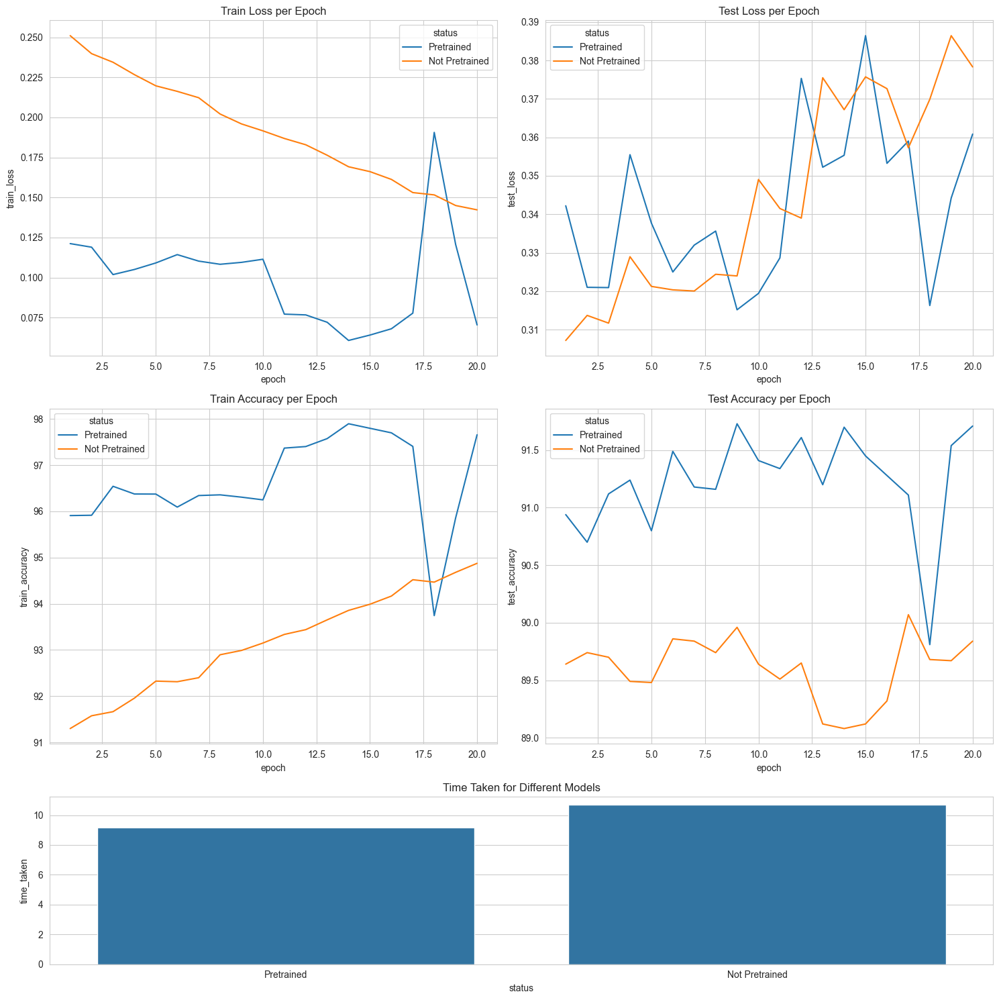

In [58]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import pandas as pd

# Assume 'performance_metrics_pretrained' and 'performance_metrics_not_pretrained' contain
# 'train_losses', 'test_losses', 'train_accuracies', 'test_accuracies', and 'time_taken'

sns.set_style("whitegrid")

# Create the figure with GridSpec layout
fig = plt.figure(figsize=(15, 15))
grid = GridSpec(3, 2, height_ratios=[1, 1, 0.5])

# Prepare data for plotting
data_pretrained = pd.DataFrame({
    'epoch': list(range(1, 21)),
    'train_loss': performance_metrics_pretrained['train_losses'],
    'test_loss': performance_metrics_pretrained['test_losses'],
    'train_accuracy': performance_metrics_pretrained['train_accuracies'],
    'test_accuracy': performance_metrics_pretrained['test_accuracies'],
    'status': ['Pretrained']*20
})

data_not_pretrained = pd.DataFrame({
    'epoch': list(range(1, 21)),
    'train_loss': performance_metrics_not_pretrained['train_losses'],
    'test_loss': performance_metrics_not_pretrained['test_losses'],
    'train_accuracy': performance_metrics_not_pretrained['train_accuracies'],
    'test_accuracy': performance_metrics_not_pretrained['test_accuracies'],
    'status': ['Not Pretrained']*20
})

combined_data = pd.concat([data_pretrained, data_not_pretrained])

# Train Loss
ax1 = fig.add_subplot(grid[0, 0])
sns.lineplot(data=combined_data, x='epoch', y='train_loss', hue='status', ax=ax1)
ax1.set_title('Train Loss per Epoch')

# Test Loss
ax2 = fig.add_subplot(grid[0, 1])
sns.lineplot(data=combined_data, x='epoch', y='test_loss', hue='status', ax=ax2)
ax2.set_title('Test Loss per Epoch')

# Train Accuracy
ax3 = fig.add_subplot(grid[1, 0])
sns.lineplot(data=combined_data, x='epoch', y='train_accuracy', hue='status', ax=ax3)
ax3.set_title('Train Accuracy per Epoch')

# Test Accuracy
ax4 = fig.add_subplot(grid[1, 1])
sns.lineplot(data=combined_data, x='epoch', y='test_accuracy', hue='status', ax=ax4)
ax4.set_title('Test Accuracy per Epoch')

# Time Taken
ax5 = fig.add_subplot(grid[2, :])
time_data = pd.DataFrame({
    'status': ['Pretrained', 'Not Pretrained'],
    'time_taken': [performance_metrics_pretrained['time_taken'], performance_metrics_not_pretrained['time_taken']]
})
sns.barplot(x='status', y='time_taken', data=time_data, ax=ax5)
ax5.set_title('Time Taken for Different Models')

plt.tight_layout()
fig.savefig('performance_comparison.pdf', format='pdf', bbox_inches='tight')
plt.show()


### Data augmentation

In [ ]:
transform = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomAffine(degrees=7, translate=(0.3,0.3)),
    transforms.ToTensor()
])


train_dataset = torchvision.datasets.MNIST('.', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.MNIST('.', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=128)

### Learning Rate Scheduling

In [ ]:
scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=7, gamma=0.1)


### Regularization

In [ ]:
opt = torch.optim.Adam(model.parameters(), weight_decay=1e-4)
